# Tarea 3 - Inteligencia Artificial
### Alejandra González Fernández y Gilbert Rodríguez Mejias

Importar bibliotecas

In [134]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from IPython.display import display, clear_output

Imágenes originales

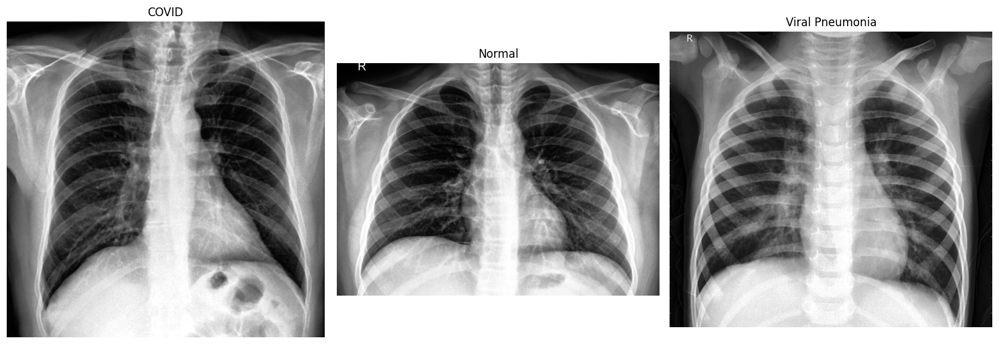

In [135]:
def display_three_images_side_by_side(image_paths,titles):
    images = [cv2.imread(path, cv2.IMREAD_GRAYSCALE) for path in image_paths]
    
    plt.figure(figsize=(15, 5))  # Tamaño de la figura que puede acomodar tres imágenes una al lado de la otra
    
    for i, img in enumerate(images, start=1):
        plt.subplot(1, 3, i)
        plt.imshow(img, cmap='gray')
        plt.title(titles[i-1])
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

titles = ['COVID', 'Normal', 'Viral Pneumonia']
image_paths = ['COVID.jpeg', 'Normal.jpeg', 'Viral Pneumonia.jpeg']
display_three_images_side_by_side(image_paths,titles)


## Blur Effect

Se comparan lo diferentes tipos de Blur Effect para verificar cual es el mejor.

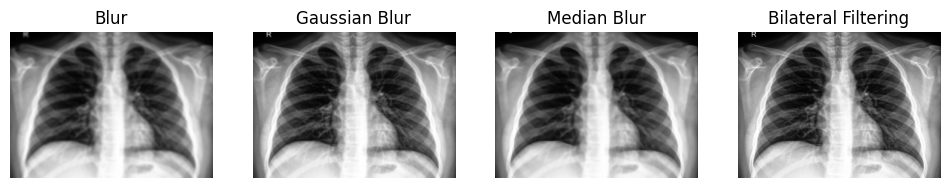

In [136]:
input_image_path = "Normal.jpeg"
original_image = cv2.imread(input_image_path, cv2.IMREAD_GRAYSCALE)

# Gaussian kernel size 
kernel_size = 35

# Aplica diferentes tipos de desenfoque para comparar
blurred_image = cv2.blur(original_image, (kernel_size, kernel_size))  # Simple Blur
gaussian_blurred_image = cv2.GaussianBlur(original_image, (kernel_size, kernel_size), 0)  # Gaussian Blur
median_blurred_image = cv2.medianBlur(original_image, kernel_size)  # Median Blur
bilateral_filtered_image = cv2.bilateralFilter(original_image,15, 25, 25)  # Bilateral Filtering

# Mostrar las imágenes resultantes
plt.figure(figsize=(12, 8))

titles = ['Blur', 'Gaussian Blur', 'Median Blur', 'Bilateral Filtering']
images = [blurred_image, gaussian_blurred_image, median_blurred_image, bilateral_filtered_image]


for i in range(4):
    plt.subplot(1, 4, i + 1)
    plt.imshow(images[i], cmap='gray')
    plt.title(titles[i])
    plt.axis('off')

plt.show()


Se prueban diferentes parametros para el efecto de blur

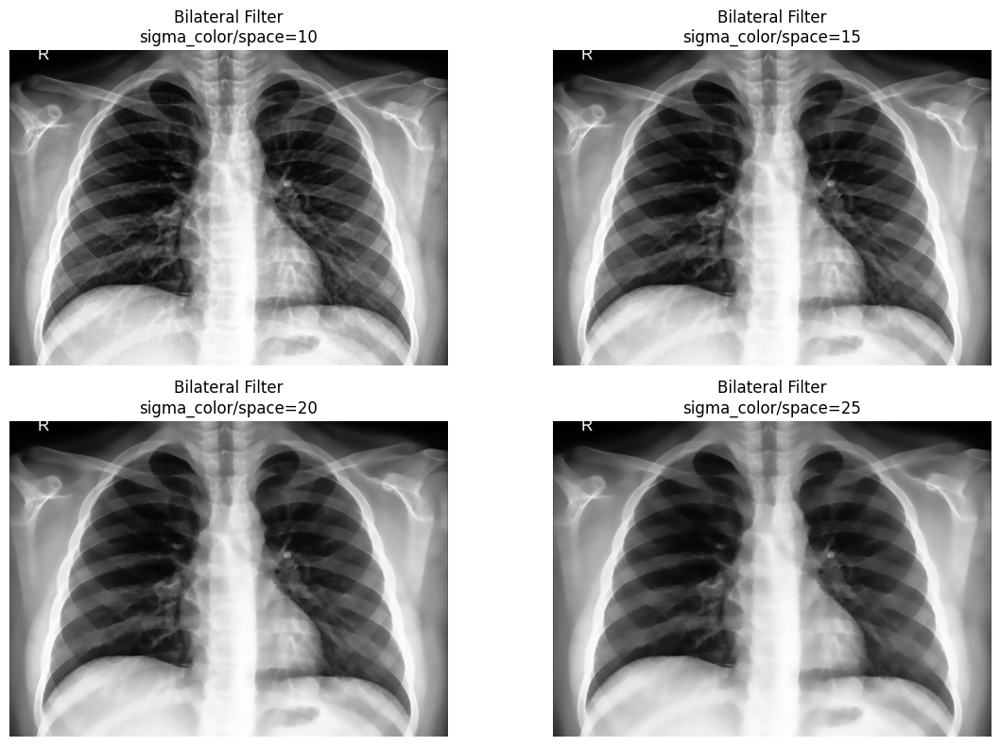

In [137]:
def apply_bilateral_filter(image, d, sigma_color, sigma_space):
    return cv2.bilateralFilter(image, d, sigma_color, sigma_space)

# Prueba el filtro bilateral con diferentes valores de sigmaColor y sigmaSpace
values = [10,15,20,25]
filtered_images = []
for value in values:
    filtered_image = apply_bilateral_filter(original_image, -1, value, value)
    filtered_images.append(filtered_image)

# Mostrar las imágenes
plt.figure(figsize=(12, 8))
for i, img in enumerate(filtered_images):
    plt.subplot(2, len(values) // 2, i + 1)
    plt.imshow(img, cmap='gray')
    plt.title(f'Bilateral Filter\nsigma_color/space={values[i]}')
    plt.axis('off')
plt.tight_layout()
plt.show()

Una vez que se escogió el parámetro, se procede a hacer la comparación entre las imágenes normales y las desenfocadas.


In [138]:
def show_images_side_by_side(image1, image2, filter):
    plt.figure(figsize=(10, 5))

    # Mostrar la primera imagen
    plt.subplot(1, 2, 1)
    plt.imshow(image1, cmap='gray')
    plt.title('Original Image')
    plt.axis('off')

    # Mostrar la segunda imagen
    plt.subplot(1, 2, 2)
    plt.imshow(image2, cmap='gray')
    plt.title(f'{filter} Filter')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

### COVID

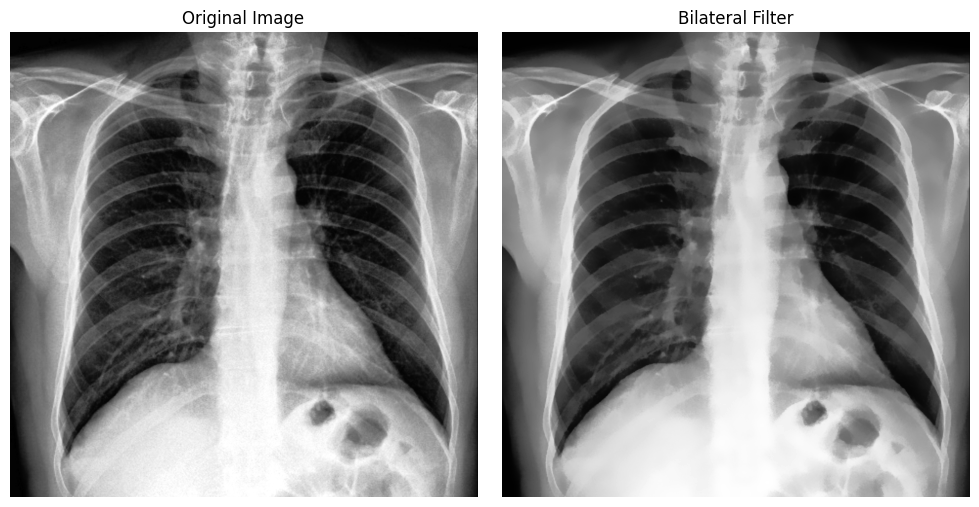

In [139]:
# Cargar la imagen original
input_image_path = "COVID.jpeg"
original_image = cv2.imread(input_image_path, cv2.IMREAD_GRAYSCALE)

# Aplicar el filtro bilateral
covid_filtered_image = apply_bilateral_filter(original_image, -1, 13, 13)

show_images_side_by_side(original_image, covid_filtered_image,"Bilateral")

### Normal


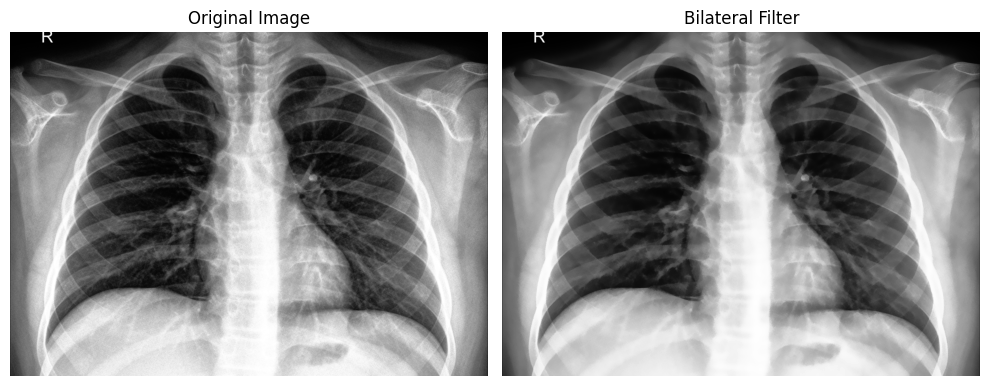

In [140]:
# Cargar la imagen original
input_image_path = "Normal.jpeg"
original_image = cv2.imread(input_image_path, cv2.IMREAD_GRAYSCALE)

# Aplicar el filtro bilateral
normal_filtered_image = apply_bilateral_filter(original_image, -1, 13, 13)

show_images_side_by_side(original_image, normal_filtered_image,"Bilateral")

### Viral Pneumonia

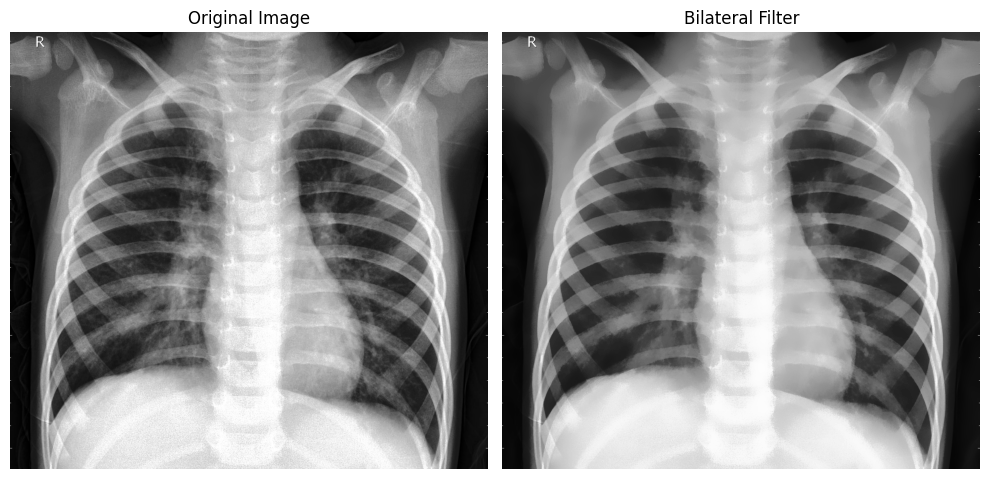

In [141]:
# Cargar la imagen original
input_image_path = "Viral Pneumonia.jpeg"
original_image = cv2.imread(input_image_path, cv2.IMREAD_GRAYSCALE)

# Aplicar el filtro bilateral
vn_filtered_image = apply_bilateral_filter(original_image, -1, 13, 13)

show_images_side_by_side(original_image, vn_filtered_image,"Bilateral")

## Sobel Edge Detection

Buscando el mejor valor de kernel

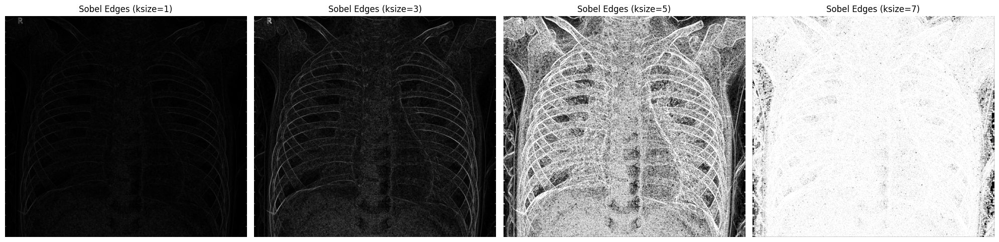

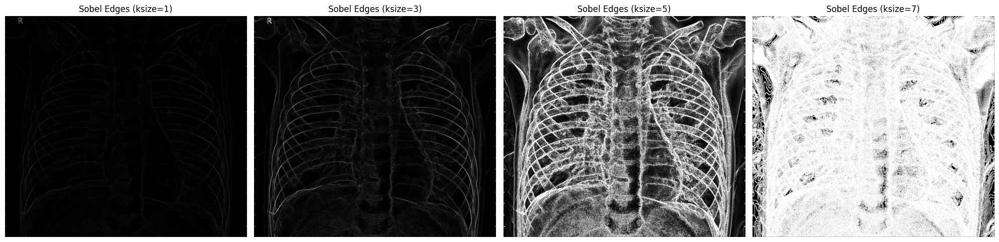

In [142]:
def apply_and_display_sobel(image, kernel_sizes):
    plt.figure(figsize=(20, 5))

    for i, ksize in enumerate(kernel_sizes, 1):
        # Aplica Sobel Edge Detection
        grad_x = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=ksize)
        grad_y = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=ksize)

        abs_grad_x = cv2.convertScaleAbs(grad_x)
        abs_grad_y = cv2.convertScaleAbs(grad_y)

        grad = cv2.addWeighted(abs_grad_x, 0.5, abs_grad_y, 0.5, 0)

        # Mostrar las imágenes
        plt.subplot(1, len(kernel_sizes), i)
        plt.imshow(grad, cmap='gray')
        plt.title(f'Sobel Edges (ksize={ksize})')
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# Ruta a la imagen y tamaños de kernel para probar
image_path = 'Viral Pneumonia.jpeg'
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
kernel_sizes = [1, 3, 5, 7]


# Uso de la función con la imagen cruda
apply_and_display_sobel(image, kernel_sizes)


# Uso de la función con la imagen con filtro blur
apply_and_display_sobel(vn_filtered_image, kernel_sizes)

Función Sobel y display

In [144]:
def apply_and_display_sobel(image):

    grad_x = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=3)
    grad_y = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=3)

    abs_grad_x = cv2.convertScaleAbs(grad_x)
    abs_grad_y = cv2.convertScaleAbs(grad_y)

    grad = cv2.addWeighted(abs_grad_x, 0.5, abs_grad_y, 0.5, 0)

    # Mostrar las imágenes
    plt.figure(figsize=(20, 5))

    plt.subplot(1, 3, 1)
    plt.imshow(cv2.convertScaleAbs(grad_x), cmap='gray')
    plt.title('Sobel X')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(cv2.convertScaleAbs(grad_y), cmap='gray')
    plt.title('Sobel Y')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(grad, cmap='gray')
    plt.title('Total')
    plt.axis('off')

    plt.show()



### COVID


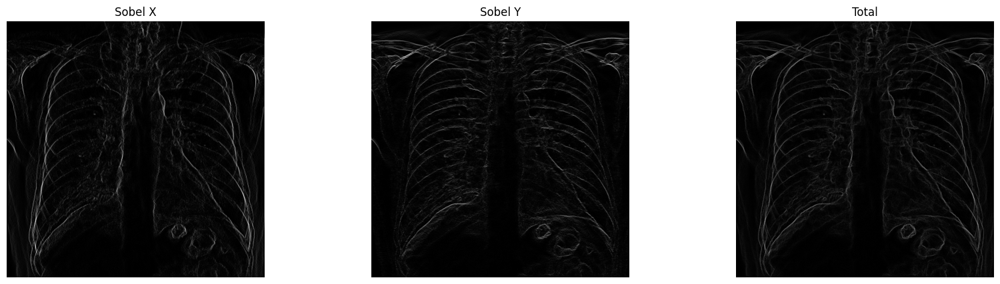

In [145]:
#Se está usando la imagen con el efecto de blur bilateral
apply_and_display_sobel(covid_filtered_image)

### Normal

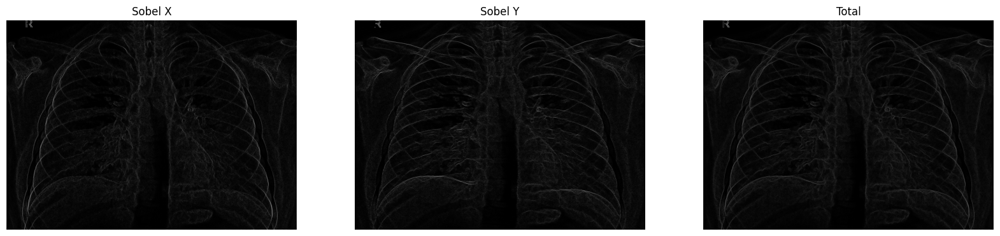

In [146]:
#Se está usando la imagen con el efecto de blur bilateral
apply_and_display_sobel(normal_filtered_image)

### Viral Pneumonia

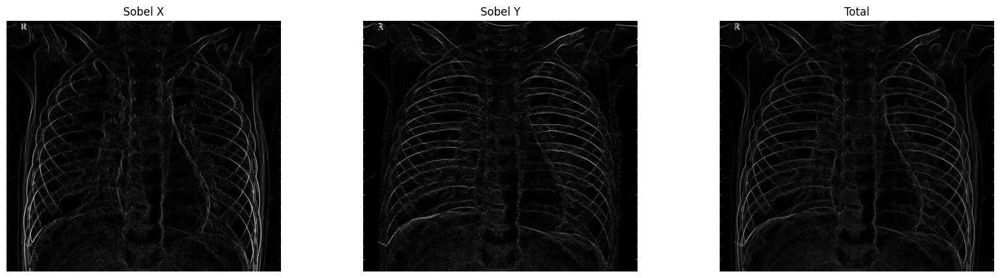

In [147]:
#Se está usando la imagen con el efecto de blur bilateral
apply_and_display_sobel(vn_filtered_image)

## Canny Edge Detection


Buscando el mejor threshold

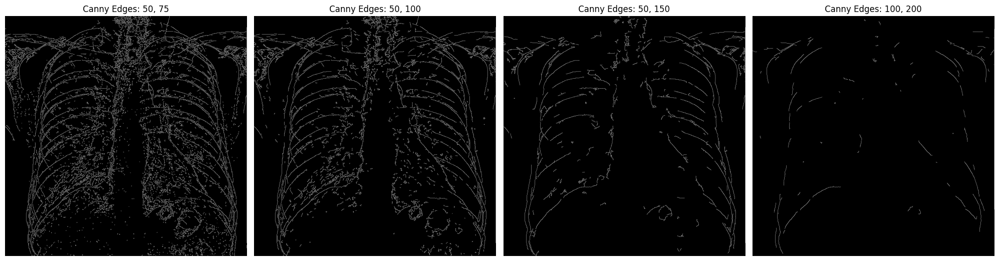

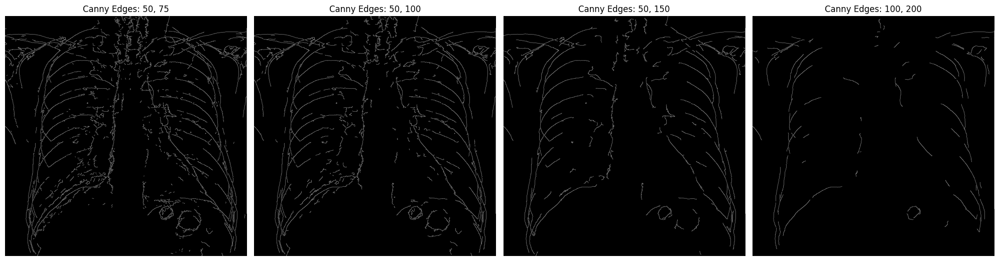

In [148]:
def apply_and_display_canny(image, thresholds):
    
    plt.figure(figsize=(20, 10))

    # Aplicar Canny Edge Detection con diferentes valores de umbral
    for i, (low_threshold, high_threshold) in enumerate(thresholds, start=1):
        edges = cv2.Canny(image, low_threshold, high_threshold)

        # Mostrar la imagen
        plt.subplot(1, len(thresholds), i)
        plt.imshow(edges, cmap='gray')
        plt.title(f'Canny Edges: {low_threshold}, {high_threshold}')
        plt.axis('off')

    plt.tight_layout()
    plt.show()


image_path = 'COVID.jpeg'
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
thresholds = [(50,75),(50,100),(50, 150), (100, 200)]

apply_and_display_canny(image, thresholds)
apply_and_display_canny(covid_filtered_image, thresholds)


Una vez que se escogió el mejor threshold se procede a aplicarle el filtro a cada una de las imagenes

In [149]:
def apply_canny(image):
    edges = cv2.Canny(image, 50, 100)
    return edges

## COVID


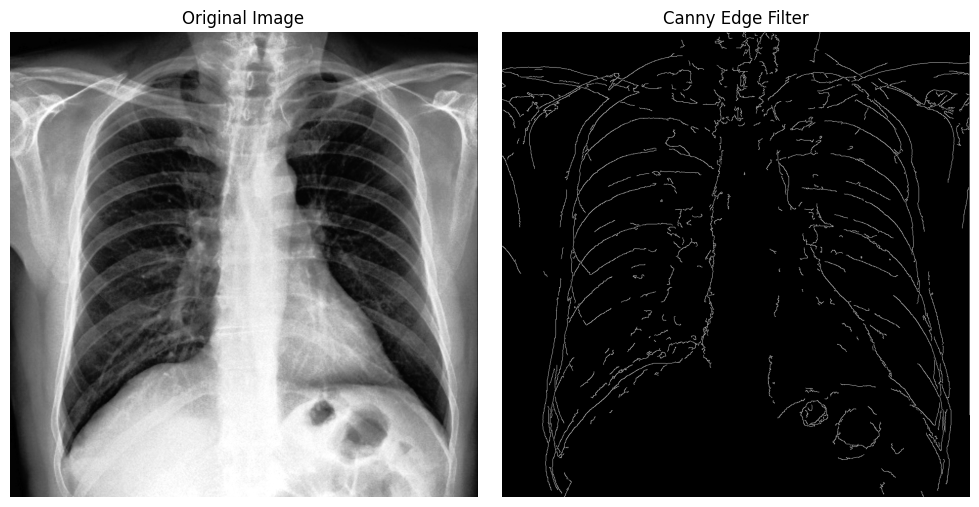

In [150]:
image_path = 'COVID.jpeg'
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
covid_canny_filter = apply_canny(covid_filtered_image)
show_images_side_by_side(image,covid_canny_filter,"Canny Edge")

## Normal

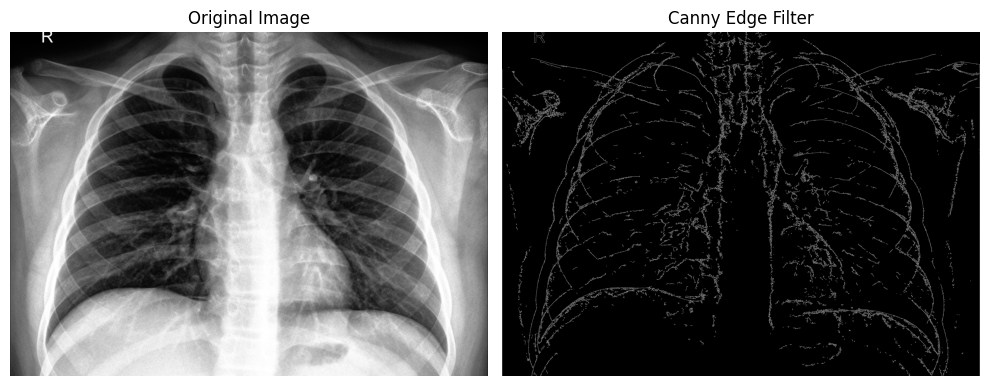

In [151]:
image_path = 'Normal.jpeg'
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
normal_canny_filter = apply_canny(normal_filtered_image)
show_images_side_by_side(image,normal_canny_filter,"Canny Edge")

## Viral pneumonia

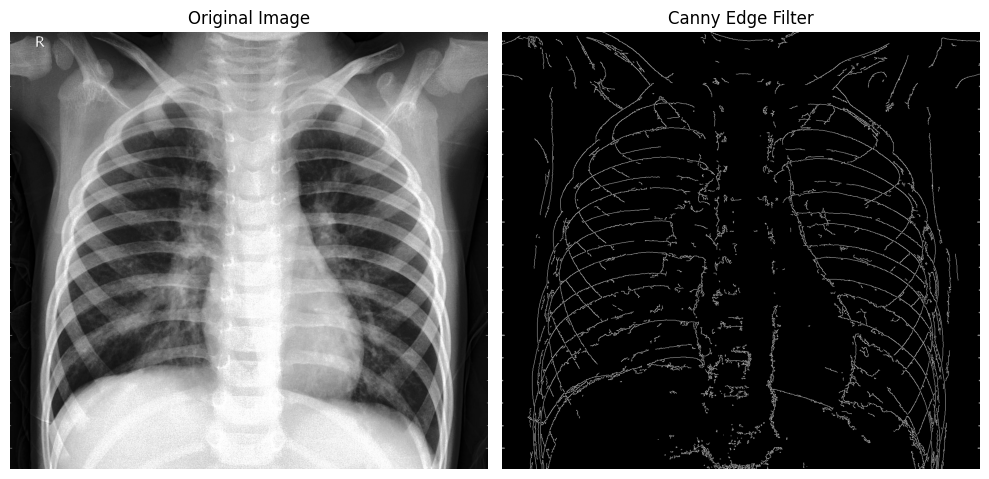

In [152]:
image_path = 'Viral Pneumonia.jpeg'
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
vn_canny_filter = apply_canny(vn_filtered_image)
show_images_side_by_side(image,vn_canny_filter,"Canny Edge")

## Filtro Escogido: Histogram Equalization


Mejora el contraste de la imagen ajustando la distribución de intensidad.


In [153]:
def apply_CLAHE(img):
    # create a CLAHE object (Arguments are optional).
    clahe = cv2.createCLAHE(clipLimit=17.0, tileGridSize=(8,8))
    cl1 = clahe.apply(img)
    return cl1

### COVID

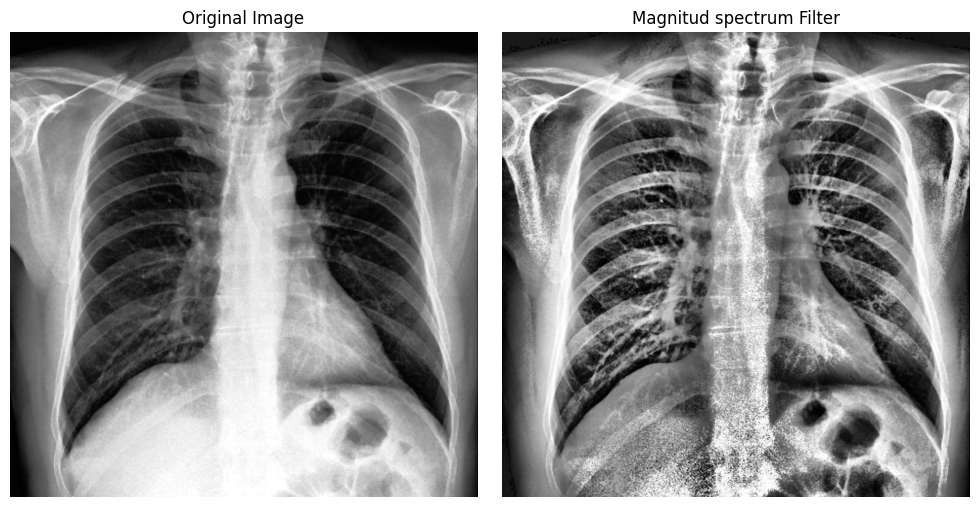

In [154]:
img = cv2.imread('COVID.jpeg', cv2.IMREAD_GRAYSCALE) 
cl1 = apply_CLAHE(img)
show_images_side_by_side(img,cl1,"Magnitud spectrum")


### Normal

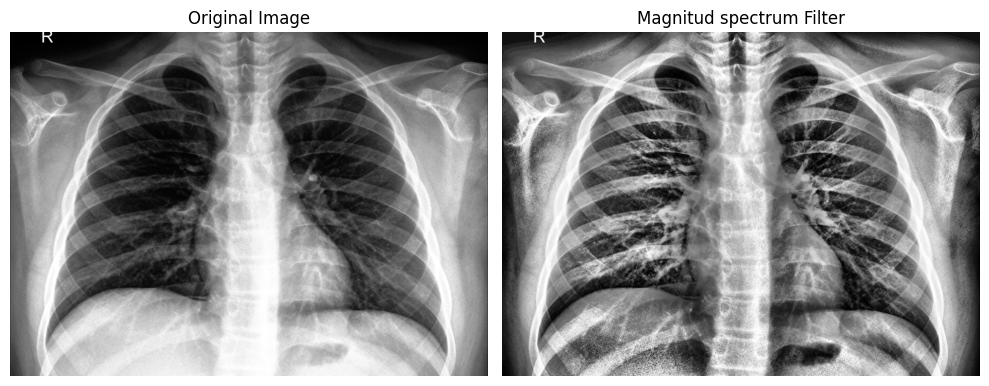

In [155]:
img = cv2.imread('Normal.jpeg', cv2.IMREAD_GRAYSCALE) 
cl1 = apply_CLAHE(img)
show_images_side_by_side(img,cl1,"Magnitud spectrum")

### Viral Pneumonia

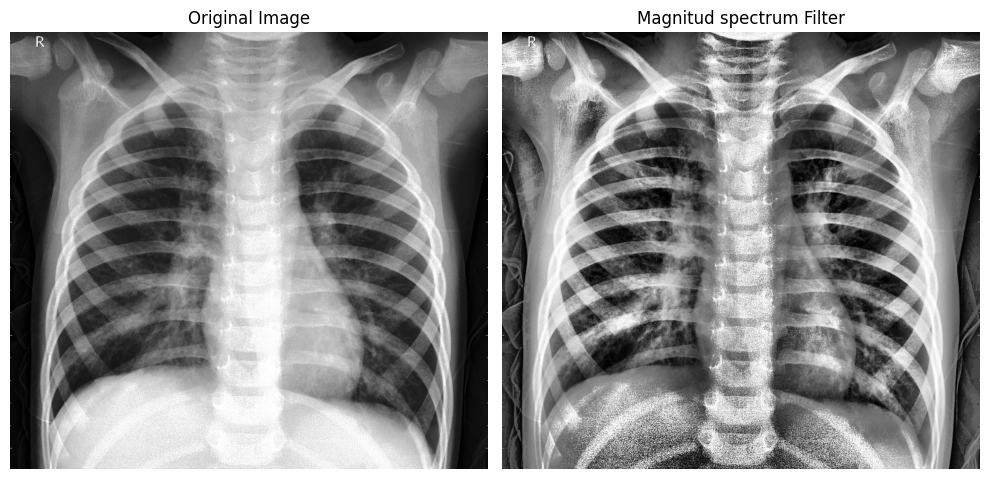

In [156]:
img = cv2.imread('Viral Pneumonia.jpeg', cv2.IMREAD_GRAYSCALE) 
cl1 = apply_CLAHE(img)
show_images_side_by_side(img,cl1,"Magnitud spectrum")